# Deep Learning based Alternaria Solani detection in Potato Fields using UAV imagery and Explainable AI (XAI)

# DATASET

**Dataset consists out of 7660 patches of 256x256 pixels, cropped out of the original images, labeled and sorted in two categories (1: Alternaria, 0: no Alternaria)**

# Importing Dependencies

In [3]:
import tensorflow as tf
from tensorflow.keras import models,layers
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import matplotlib.image as mpimg

In [5]:
BATCH_SIZE=32
IMAGE_SIZE=256
CHANNELS=3
EPOCHS=50

# Loading Dataset for Training

In [6]:
dataset=tf.keras.preprocessing.image_dataset_from_directory(
    '/kaggle/input/data-all-together/Alternaria_2022/2022',
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 7143 files belonging to 2 classes.


# Fetching Class Names from the Dataset

In [7]:
class_names=dataset.class_names
class_names

['0', '1']

# Give Paths

In [8]:
import os

NO_ALTERNARIA_0 = '/kaggle/input/data-all-together/Alternaria_2022/2022/0'
ALTERNARIA_1= '/kaggle/input/data-all-together/Alternaria_2022/2022/1'


# Data Visualization

[3327, 3816]


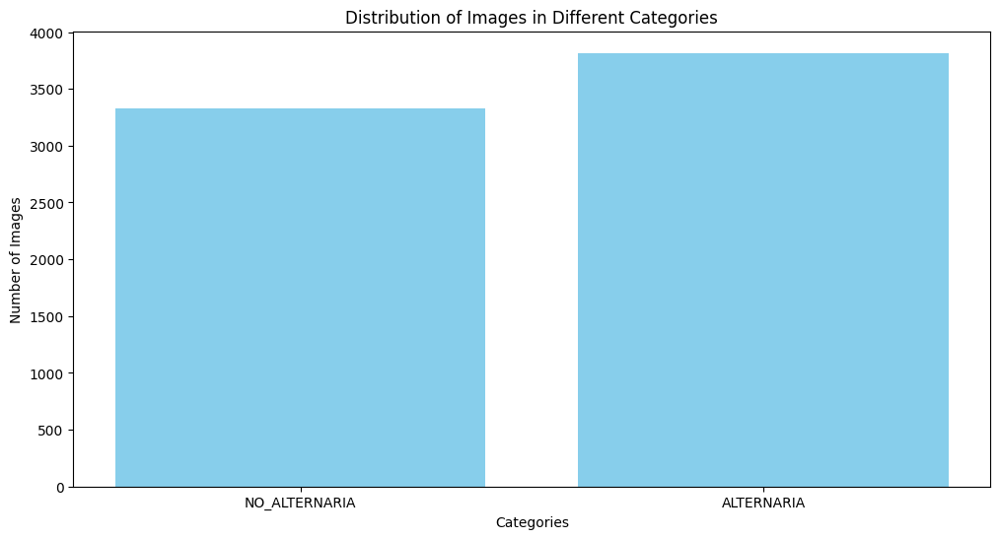

In [138]:
import matplotlib.pyplot as plt

# Define the categories and corresponding counts
categories = ['NO_ALTERNARIA', 'ALTERNARIA']
counts = [len(os.listdir(NO_ALTERNARIA_0)), len(os.listdir(ALTERNARIA_1))]
print(counts)
# Create a bar plot to visualize the distribution of images
plt.figure(figsize=(12, 6))
plt.bar(categories, counts, color='skyblue')
plt.xlabel('Categories')
plt.ylabel('Number of Images')
plt.title('Distribution of Images in Different Categories')
plt.show()

# Visualizing Sample Images from the Dataset

# 1 : ALTERNARIA
# 0 : NO ALTERNARIA

(32, 256, 256, 3)


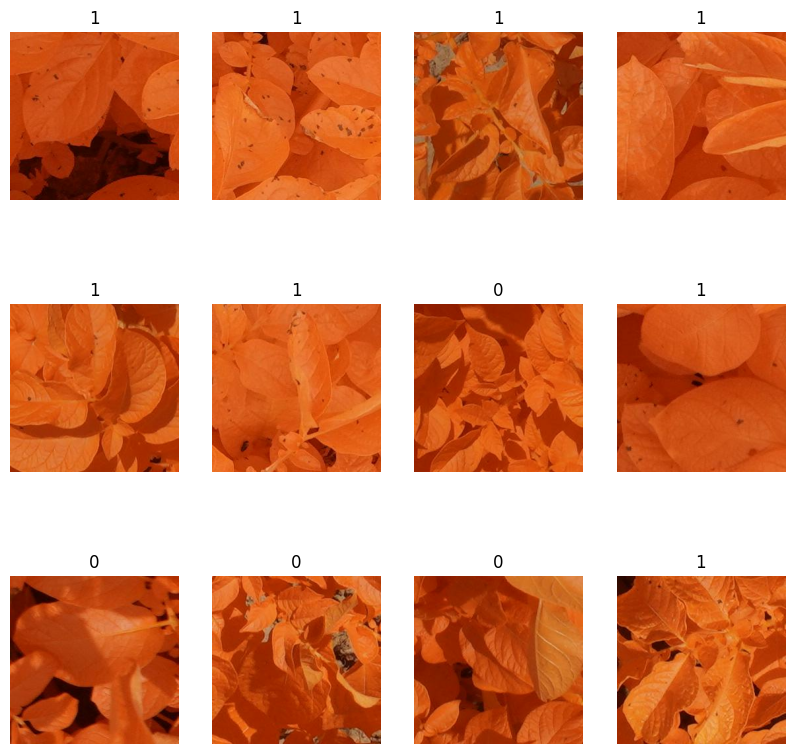

In [10]:
plt.figure(figsize=(10,10))
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    #print(labels_batch.numpy())
    for i in range(12):
        ax=plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

# Split Dataset into Training and Validation Sets

In [11]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.2, shuffle=True, shuffle_size=10000):
    assert(train_split+val_split)==1

    ds_size=len(ds)

    if shuffle:
        ds=ds.shuffle(shuffle_size, seed=12)

    train_size=int(train_split*ds_size)
    val_size=int(val_split*ds_size)

    train_ds=ds.take(train_size)
    val_ds=ds.skip(train_size).take(val_size)

    return train_ds, val_ds

In [12]:
train_ds, val_ds =get_dataset_partitions_tf(dataset)

In [ ]:
len(train_ds)

In [ ]:
len(val_ds)

# Data Augmentation

In [13]:
train_ds= train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds= val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [14]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch[0].numpy()/255)

[[[0.827451   0.32156864 0.09411765]
  [0.827451   0.32156864 0.09411765]
  [0.827451   0.32156864 0.09803922]
  ...
  [0.87058824 0.38039216 0.15294118]
  [0.8666667  0.3764706  0.14901961]
  [0.8627451  0.37254903 0.14509805]]

 [[0.8392157  0.32941177 0.10196079]
  [0.827451   0.32156864 0.09411765]
  [0.81960785 0.3137255  0.09019608]
  ...
  [0.84705883 0.35686275 0.12941177]
  [0.8392157  0.34901962 0.12156863]
  [0.8352941  0.34509805 0.11764706]]

 [[0.8509804  0.32941177 0.10588235]
  [0.83137256 0.32156864 0.09411765]
  [0.8235294  0.3137255  0.08627451]
  ...
  [0.8235294  0.33333334 0.10588235]
  [0.81960785 0.32941177 0.10196079]
  [0.81960785 0.32941177 0.10196079]]

 ...

 [[0.8352941  0.34117648 0.11372549]
  [0.8392157  0.34509805 0.11764706]
  [0.84705883 0.3529412  0.1254902 ]
  ...
  [0.83137256 0.29803923 0.0627451 ]
  [0.8156863  0.28235295 0.04705882]
  [0.8        0.26666668 0.03137255]]

 [[0.8352941  0.34117648 0.11372549]
  [0.84313726 0.34901962 0.12156863]


# Convolutional Neural Network (CNN) for Image Classification

In [26]:
from tensorflow.keras import layers, models
from keras.layers import Dropout
from keras.layers import GlobalMaxPooling2D

model = models.Sequential()

model.add(layers.Conv2D(32, (3, 3), padding='same', input_shape=(256, 256, 3)))
model.add(layers.BatchNormalization())
model.add(layers.Activation('relu'))
model.add(layers.AveragePooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.Activation('relu'))
model.add(layers.AveragePooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.Activation('relu'))
model.add(layers.AveragePooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.Activation('relu'))
model.add(layers.AveragePooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.Activation('relu'))
model.add(layers.AveragePooling2D((2, 2)))

model.add(GlobalMaxPooling2D())

model.add(layers.Flatten())

model.add(layers.Dense(256))
model.add(layers.BatchNormalization())
model.add(layers.Activation('relu'))
model.add(Dropout(0.5))

model.add(layers.Dense(1, activation='sigmoid'))


# MODEL SUMMARY

In [27]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_5             │ (None, 128, 128, 32)   │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_6             │ (None, 64, 64, 64)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_7             │ (None, 32, 32, 64)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_9 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_8             │ (None, 16, 16, 128)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_10 (Activation)      │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_9             │ (None, 8, 8, 256)      │             0 │
│ (AveragePooling2D)              │                        │             

 Total params: 494,593 (1.89 MB)

 Trainable params: 492,993 (1.88 MB)

 Non-trainable params: 1,600 (6.25 KB)

# Graphical representation of CNN model

In [29]:
!apt-get -qq install -y graphviz && pip install pydot

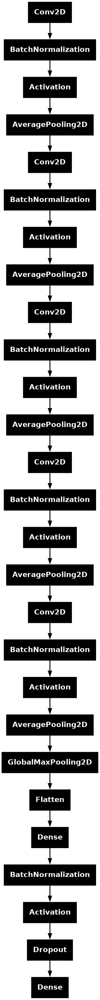

In [30]:
from tensorflow.keras.utils import plot_model

tf.keras.utils.plot_model(
    model,
    to_file='model.png',
    show_shapes=False,
    show_dtype=False,
    show_layer_names=False,
    rankdir='TB',
    expand_nested=False,
    dpi=100,
    show_layer_activations=False,
    show_trainable=False,
)

# COMPILING MODEL USING ADAM

In [32]:
from tensorflow.keras import optimizers

model.compile(
    loss='binary_crossentropy',
    optimizer=optimizers.Adam(learning_rate=0.0001),
    metrics=['accuracy']
)

# TRAIN MODEL

In [33]:
history=model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=30
)

Epoch 1/30
179/179 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - accuracy: 0.5643 - loss: 0.7887 - val_accuracy: 0.5980 - val_loss: 0.6776
Epoch 2/30
179/179 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.6381 - loss: 0.6772 - val_accuracy: 0.6747 - val_loss: 0.6217
Epoch 3/30
179/179 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.6350 - loss: 0.6656 - val_accuracy: 0.6818 - val_loss: 0.6294
Epoch 4/30
179/179 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.6755 - loss: 0.6154 - val_accuracy: 0.6776 - val_loss: 0.5952
Epoch 5/30
179/179 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.6731 - loss: 0.6247 - val_accuracy: 0.5774 - val_loss: 0.9806
Epoch 6/30
179/179 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.6853 - loss: 0.6131 - val_accuracy: 0.6889 - val_loss: 0.6002
Epoch 7/30
179/179 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.7111 - loss: 0.5676 - val_accuracy: 0.6172 - val_loss: 0.7044
Epoch 8/30
179/179 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.7323 - loss: 0.5307 -

In [34]:
scores=model.evaluate(val_ds)

44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9292 - loss: 0.2327


In [35]:
scores

[0.2380276322364807, 0.9303977489471436]

In [36]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

# Training History Metrics

In [37]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

In [38]:
history.history['accuracy']

[0.5944240093231201,
 0.6361563801765442,
 0.6465018391609192,
 0.6736805438995361,
 0.6775381565093994,
 0.6936699748039246,
 0.7131334543228149,
 0.724180281162262,
 0.7418902516365051,
 0.7610029578208923,
 0.7748553156852722,
 0.7964229583740234,
 0.8248290419578552,
 0.8458706140518188,
 0.8693670034408569,
 0.894441545009613,
 0.9095212817192078,
 0.9314395785331726,
 0.9491495490074158,
 0.9679116010665894,
 0.9675609469413757,
 0.979484498500824,
 0.9877257347106934,
 0.9880764484405518,
 0.9922847747802734,
 0.9947395920753479,
 0.9968437552452087,
 0.9991232752799988,
 0.999298632144928,
 0.9996492862701416]

# Training History Visualization

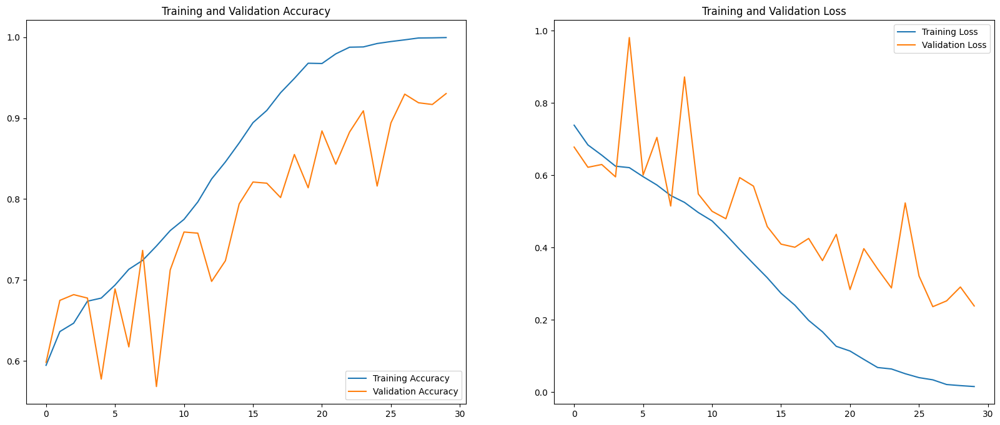

In [39]:
EPOCHS=30
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# Prediction of Image Labels from Validation Dataset

First image to predict


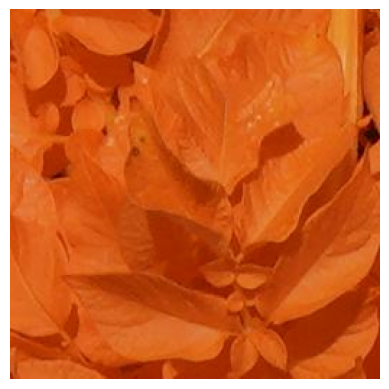

Actual Label: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Predicted Label: 1


In [43]:
import numpy as np
import matplotlib.pyplot as plt

for images_batch, labels_batch in val_ds.take(1):
    first_image = images_batch[0].numpy().astype("uint8")
    print("First image to predict")
    plt.imshow(first_image)
    plt.axis('off')  # Hide axes
    plt.show()
    print("Actual Label:", class_names[int(labels_batch[0].numpy())])

    batch_prediction = model.predict(images_batch)
    predicted_label = (batch_prediction[0] > 0.5).astype("int32")

    print("Predicted Label:", class_names[predicted_label[0]])

In [45]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  #predicted_class=class_names[np.argmax(predictions[0])]
  predicted_class = (batch_prediction[0] > 0.5).astype("int32")
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


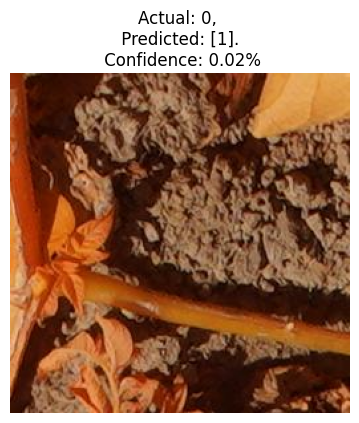

In [49]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


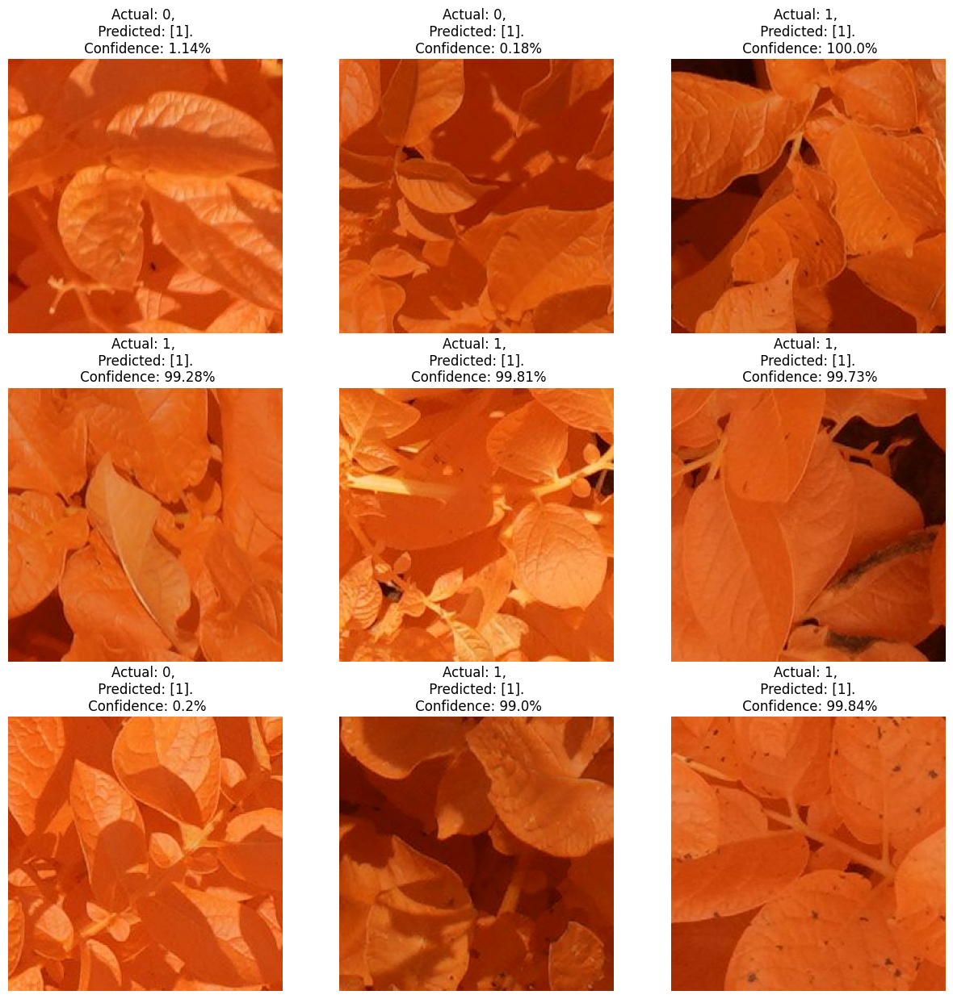

In [48]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

# SAVING MODEL

In [41]:
from tensorflow.keras.models import save_model

# Save the TensorFlow model in .h5 format

# With this line
model.save('/kaggle/working/CNN_final_last.keras')

In [15]:
from tensorflow.keras.models import load_model

# Save the TensorFlow model in .h5 format

# With this line
model= load_model('/kaggle/input/all-pre-trained-models/keras/default/1/Resnet_final.h5')

# Evaluating Model Predictions on Validation Dataset

In [50]:
y_true = []
y_pred = []

for images, labels in val_ds:
    
    predictions = model.predict(images)
    pred_labels = (predictions > 0.5).astype("int32")
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

# Evaluation Metrics

In [51]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9303977272727273
Precision: 0.9308950459226696
Recall: 0.9303977272727273
F1 Score: 0.9304583408359519


# Visualization of Confusion Matrix

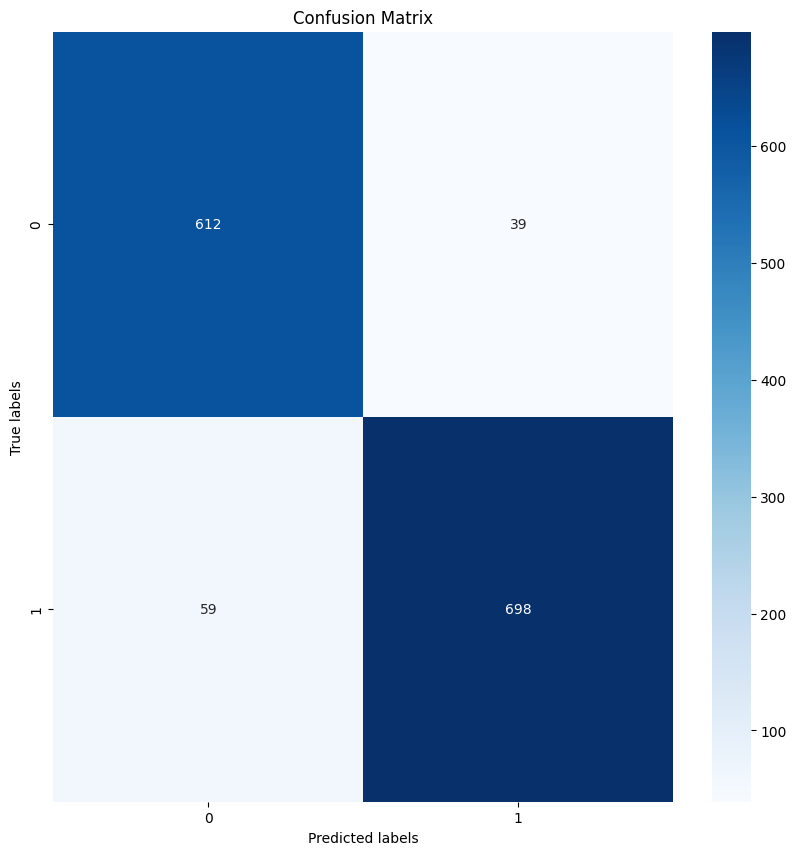

In [52]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve

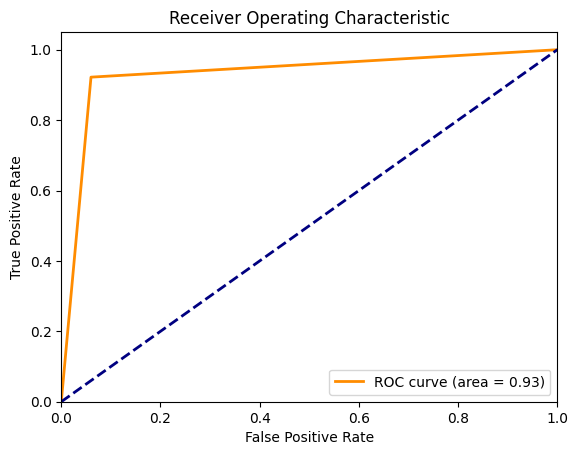

In [53]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


# AUC SCORE

In [54]:
from sklearn.metrics import roc_auc_score

auc = roc_auc_score(y_true, y_pred)

print(f'AUC Score: {auc}')


AUC Score: 0.931076466040458


# VGG16

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16

def build_vgg16_model():
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(1, activation='sigmoid')
    ])
    return model

model_VGG16 = build_vgg16_model()

In [ ]:

model_VGG16.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
history_vgg = model_VGG16.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=30
)

In [ ]:
scores=model_VGG16.evaluate(val_ds)

In [ ]:
scores

In [ ]:
acc=history_vgg.history['accuracy']
val_acc=history_vgg.history['val_accuracy']

loss=history_vgg.history['loss']
val_loss=history_vgg.history['val_loss']

In [ ]:
history_vgg.history['accuracy']

In [ ]:
EPOCHS=30
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [108]:
from tensorflow.keras.models import load_model

model1= load_model('/kaggle/input/pre-trained-models-final/keras/default/1/VGG16_final.h5')

# Predictions of Image Labels on Validation dataset

First image to predict


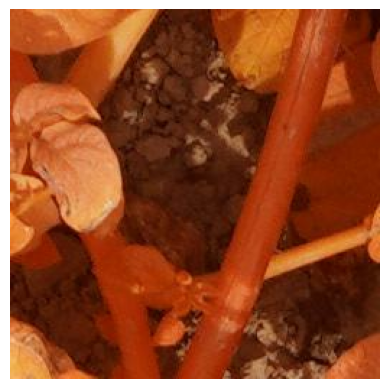

Actual Label: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step
Predicted Label: 0


In [109]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'val_ds' is your validation dataset and 'class_names' is defined
for images_batch, labels_batch in val_ds.take(1):
    first_image = images_batch[0].numpy().astype("uint8")
    print("First image to predict")
    plt.imshow(first_image)
    plt.axis('off')  # Hide axes
    plt.show()

    # Assuming class_names = ['Class 0', 'Class 1']
    print("Actual Label:", class_names[int(labels_batch[0].numpy())])

    # Predict the probability of the positive class
    batch_prediction = model1.predict(images_batch)
    predicted_label = (batch_prediction[0] > 0.5).astype("int32")

    print("Predicted Label:", class_names[predicted_label[0]])

In [110]:
def predict(model1, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model1.predict(img_array)

  #predicted_class=class_names[np.argmax(predictions[0])]
  predicted_class = (batch_prediction[0] > 0.5).astype("int32")
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step


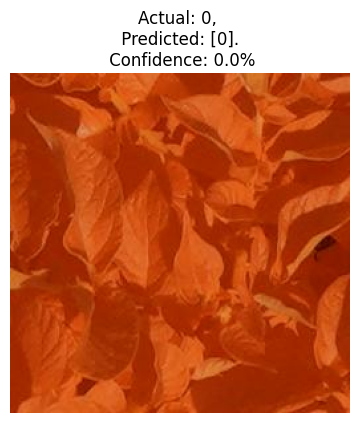

In [111]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model1, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


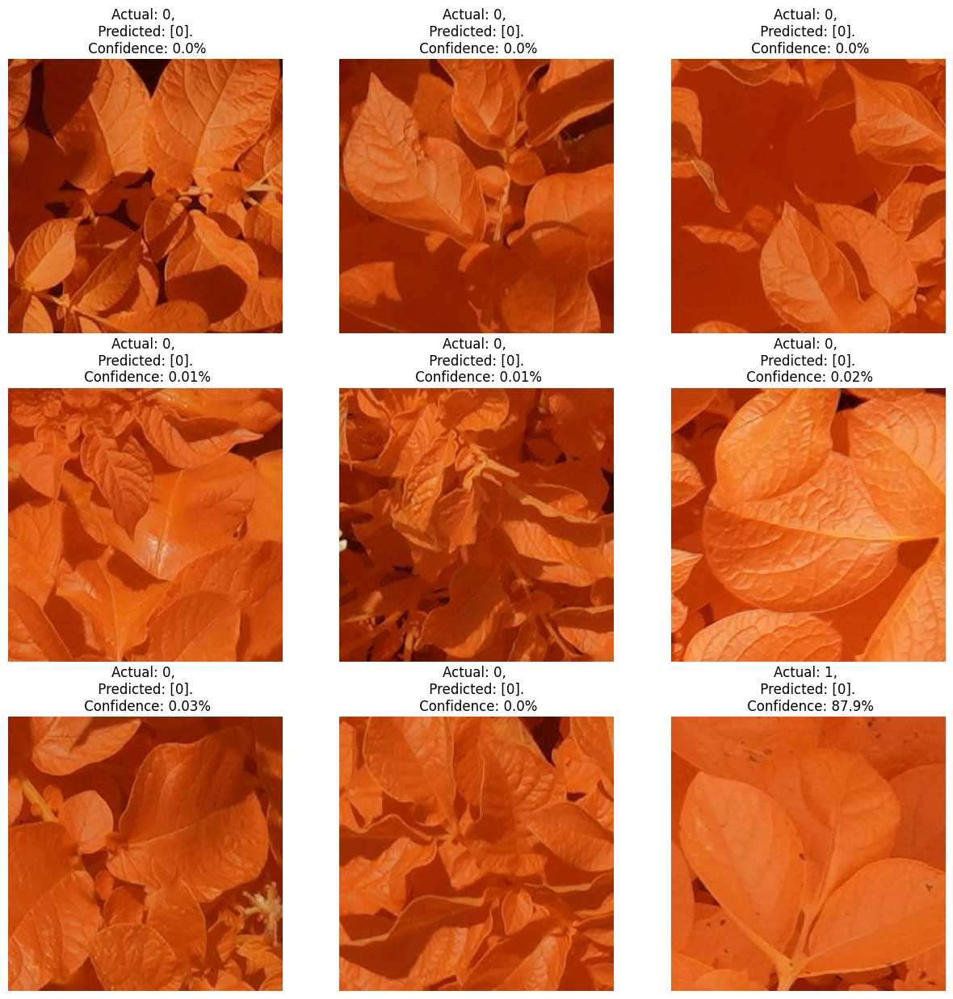

In [112]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model1, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

In [113]:
y_true = []
y_pred = []

for images, labels in val_ds:
   
    predictions = model1.predict(images)
    pred_labels = (predictions > 0.5).astype("int32")
    
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

# Evaluation Metrics for VGG16

In [114]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9026988636363636
Precision: 0.9057374136090087
Recall: 0.9026988636363636
F1 Score: 0.9021212466043561


# Confusion Matrix for VGG16

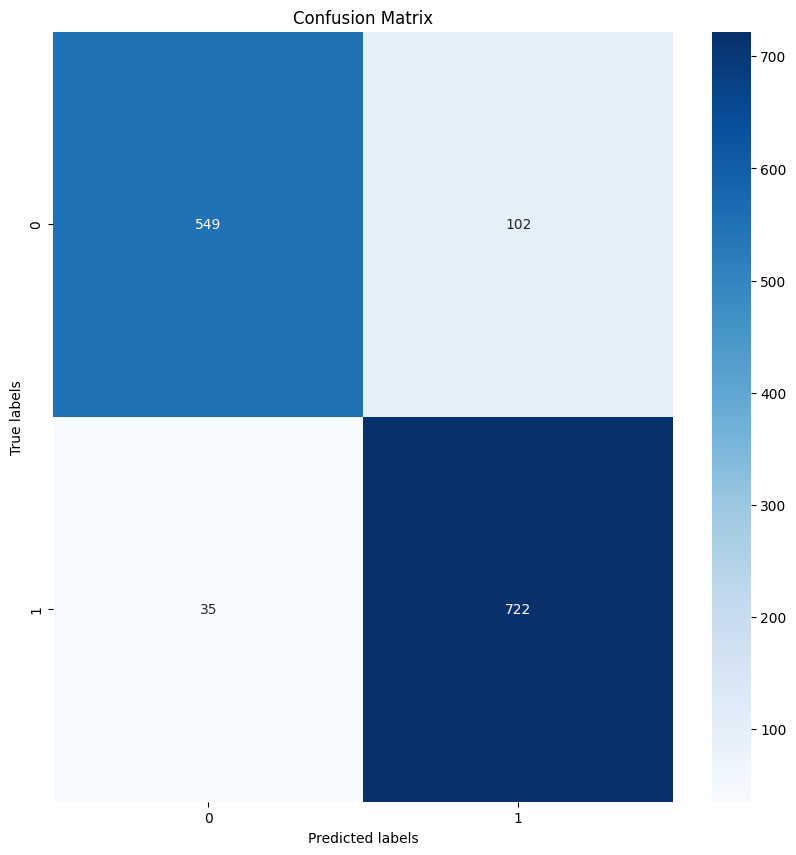

In [115]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve

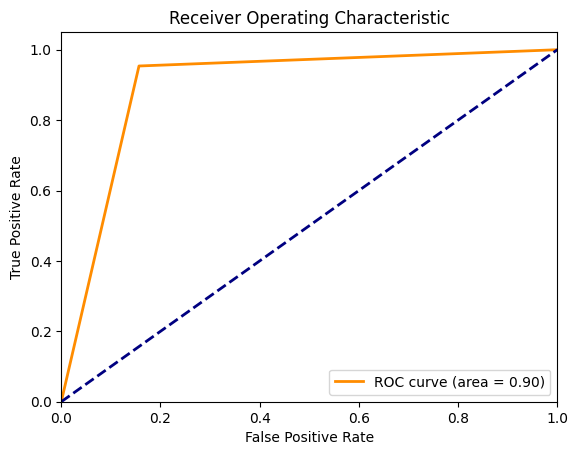

In [116]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


# AUC SCORE VGG16

In [117]:
from sklearn.metrics import roc_auc_score

auc = roc_auc_score(y_true, y_pred)

print(f'AUC Score: {auc}')


AUC Score: 0.8985414168224072


# VGG19

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG19

vgg19_model = VGG19(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))


for layer in vgg19_model.layers:
    layer.trainable = False

flatten_layer = layers.Flatten()(vgg19_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
output_layer = layers.Dense(1, activation='sigmoid')(dense_layer_1)


model_VGG19 = models.Model(inputs=vgg19_model.input, outputs=output_layer)

In [ ]:
model_VGG19.compile(
    optimizer='adam',
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
history_vgg19 = model_VGG19.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=30
)

In [ ]:
scores=model_vgg19.evaluate(val_ds)

In [ ]:
history_vgg19.history.keys()

In [ ]:
acc=history_vgg19.history['accuracy']
val_acc=history_vgg19.history['val_accuracy']

loss=history_vgg19.history['loss']
val_loss=history_vgg19.history['val_loss']

In [ ]:
EPOCHS=7
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [61]:
from tensorflow.keras.models import load_model

model1= load_model('/kaggle/input/pre-trained-models-final/keras/default/1/VGG19_final.h5')

# Prediction of Image labels from validation dataset

First image to predict


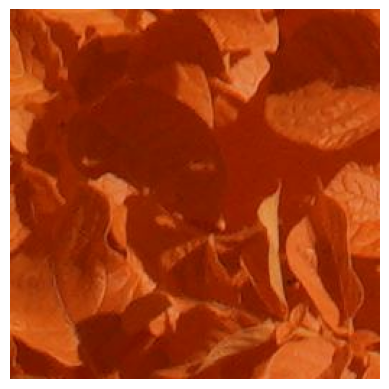

Actual Label: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 46s 46s/step
Predicted Label: 0


In [62]:
import numpy as np
import matplotlib.pyplot as plt

for images_batch, labels_batch in val_ds.take(1):
    first_image = images_batch[0].numpy().astype("uint8")
    print("First image to predict")
    plt.imshow(first_image)
    plt.axis('off')  # Hide axes
    plt.show()

    print("Actual Label:", class_names[int(labels_batch[0].numpy())])

    batch_prediction = model1.predict(images_batch)
    predicted_label = (batch_prediction[0] > 0.5).astype("int32")

    print("Predicted Label:", class_names[predicted_label[0]])

In [63]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model1.predict(img_array)

  #predicted_class=class_names[np.argmax(predictions[0])]
  predicted_class = (batch_prediction[0] > 0.5).astype("int32")
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


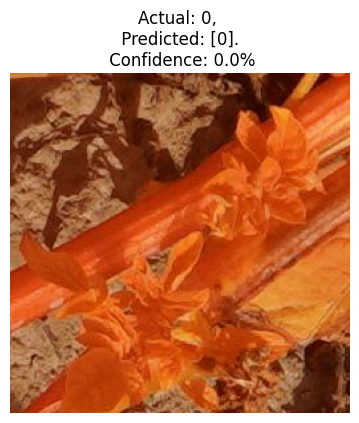

In [65]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model1, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


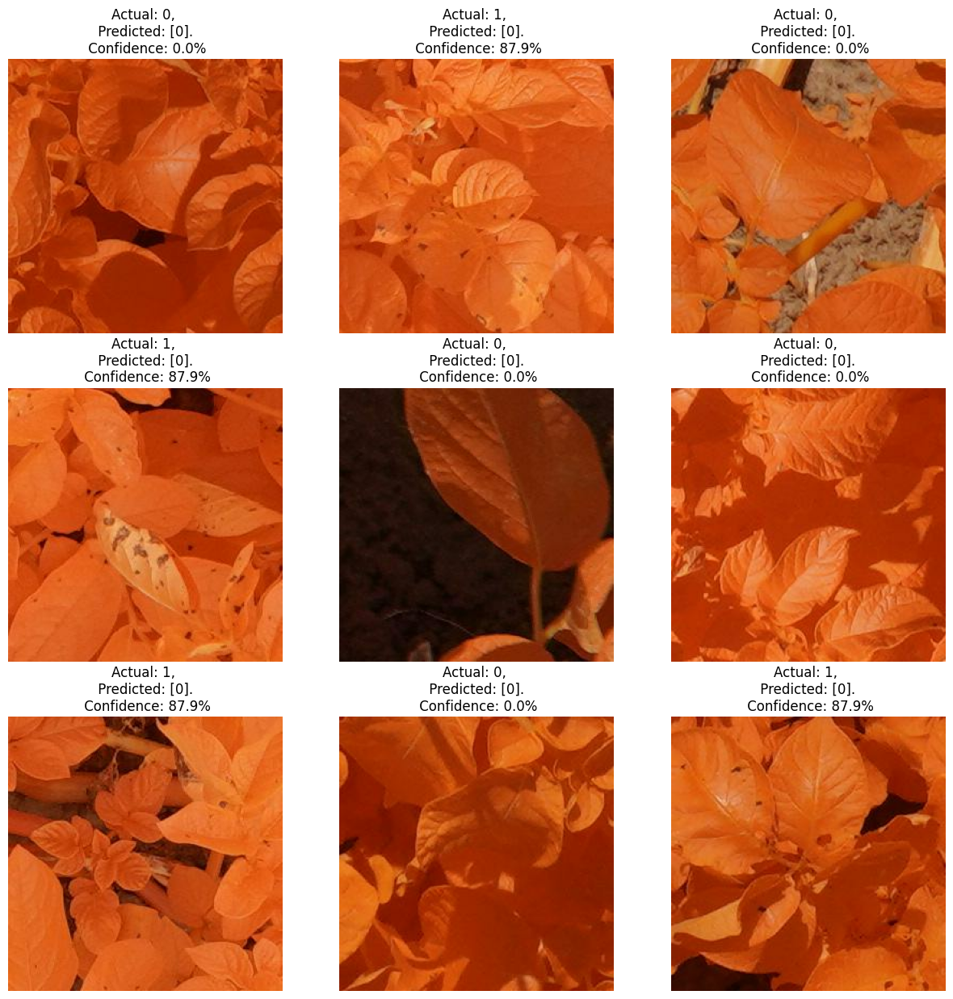

In [73]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model1, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

In [68]:
y_true = []
y_pred = []

for images, labels in val_ds:
    predictions = model1.predict(images)
    pred_labels = (predictions > 0.5).astype("int32")

    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

# EVALUATION METRICS VGG19

In [69]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9026988636363636
Precision: 0.9057374136090087
Recall: 0.9026988636363636
F1 Score: 0.9021212466043561


# Confusion Matrix VGG19

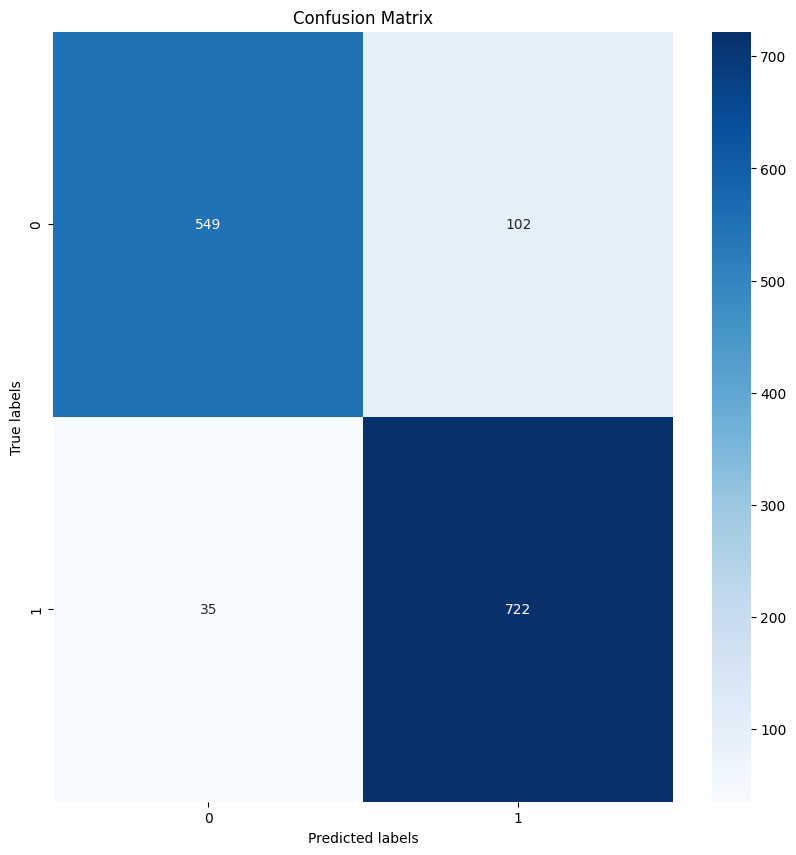

In [70]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve

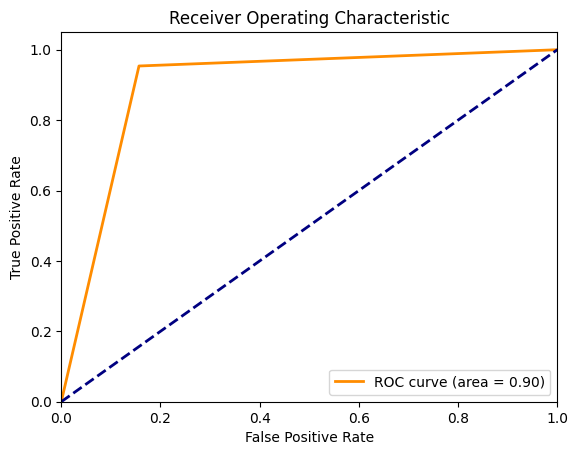

In [71]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


# AUC SCORE VGG19

In [72]:
from sklearn.metrics import roc_auc_score

auc = roc_auc_score(y_true, y_pred)

print(f'AUC Score: {auc}')


AUC Score: 0.8985414168224072


# INCEPTIONV3

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import InceptionV3

inceptionv3_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

for layer in inceptionv3_model.layers:
    layer.trainable = False

flatten_layer = layers.Flatten()(inceptionv3_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
dense_layer_2 = layers.Dense(256, activation='relu')(dense_layer_1)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_2)

inceptionv3_model = models.Model(inputs=inceptionv3_model.input, outputs=output_layer)

In [ ]:
inceptionv3_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
history_inceptionv3 = inceptionv3_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=30,
)

In [ ]:
scores=inceptionv3_model.evaluate(val_ds)

In [ ]:
scores

In [ ]:
history_inceptionv3.history.keys()

In [ ]:
acc=history_inceptionv3.history['accuracy']
val_acc=history_inceptionv3.history['val_accuracy']

loss=history_inceptionv3.history['loss']
val_loss=history_inceptionv3.history['val_loss']

In [ ]:
history_inceptionv3.history['accuracy']

In [ ]:
EPOCHS=30
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [74]:
from tensorflow.keras.models import load_model

model2= load_model('/kaggle/input/pre-trained-models-final/keras/default/1/InceptionV3_final.h5')

# Prediction of Image labels

First image to predict


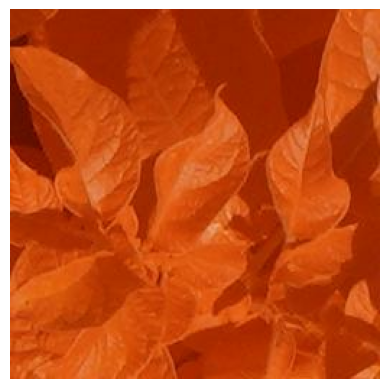

Actual Label: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms/step
Predicted Label: 0


In [75]:
import numpy as np
import matplotlib.pyplot as plt

for images_batch, labels_batch in val_ds.take(1):
    first_image = images_batch[0].numpy().astype("uint8")
    print("First image to predict")
    plt.imshow(first_image)
    plt.axis('off')  # Hide axes
    plt.show()

    print("Actual Label:", class_names[int(labels_batch[0].numpy())])

    batch_prediction = model2.predict(images_batch)
    predicted_label = (batch_prediction[0] > 0.5).astype("int32")

    print("Predicted Label:", class_names[predicted_label[0]])

In [84]:
def predict(model2, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model2.predict(img_array)

  #predicted_class=class_names[np.argmax(predictions[0])]
  predicted_class = (batch_prediction[0] > 0.5).astype("int32")
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


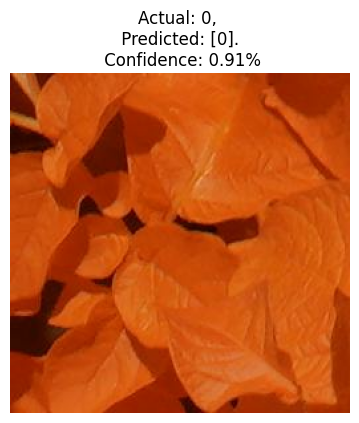

In [87]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model2, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


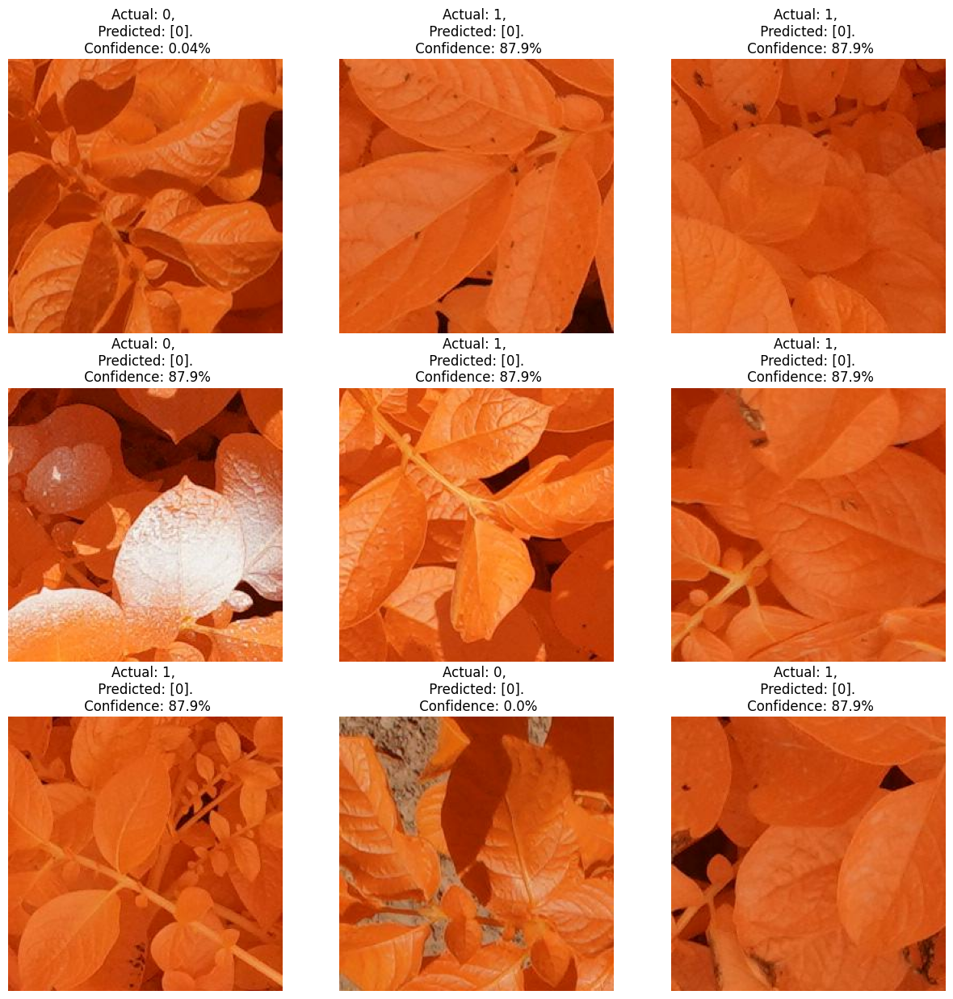

In [88]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model2, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

In [91]:

y_true1 = []
y_pred1 = []

for images, labels in val_ds:
    predictions = model2.predict(images)
    pred_labels = (predictions > 0.5).astype("int32")

    y_true1.extend(labels.numpy())
    y_pred1.extend(pred_labels)

y_true1 = np.array(y_true1)
y_pred1 = np.array(y_pred1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

# Evaluation Metrics

In [92]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


accuracy = accuracy_score(y_true1, y_pred1)
precision = precision_score(y_true1, y_pred1, average='weighted')
recall = recall_score(y_true1, y_pred1, average='weighted')
f1 = f1_score(y_true1, y_pred1, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9026988636363636
Precision: 0.9057374136090087
Recall: 0.9026988636363636
F1 Score: 0.9021212466043561


# Confusion MAtrix InceptionV3

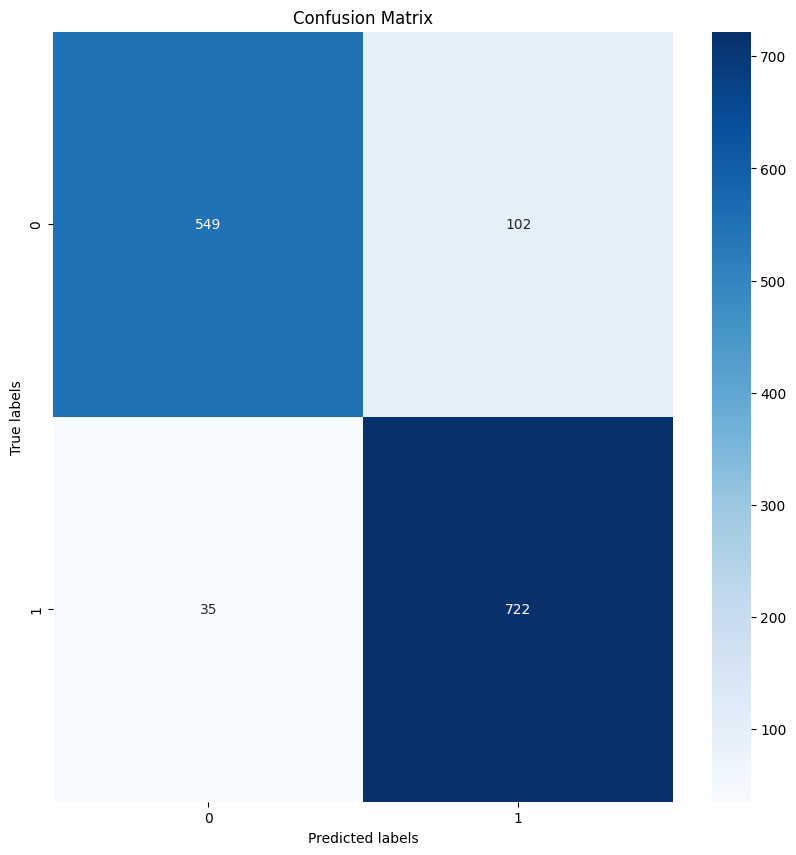

In [93]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true1, y_pred1)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# ROC CURVE InceptionV3

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


# AUC score InceptionV3

In [ ]:
from sklearn.metrics import roc_auc_score

auc = roc_auc_score(y_true, y_pred)

print(f'AUC Score: {auc}')


# RESNET 50

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50

resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(256,256, 3))

for layer in resnet_model.layers:
    layer.trainable = False


flatten_layer = layers.Flatten()(resnet_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
dense_layer_2 = layers.Dense(256, activation='relu')(dense_layer_1)
output_layer = layers.Dense(1, activation='sigmoid')(dense_layer_2)


resnet50_custom_model = models.Model(inputs=resnet_model.input, outputs=output_layer)

In [ ]:
resnet50_custom_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
history_resnet50 = resnet50_custom_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=20,   
)

In [ ]:
scores_paper= resnet50_custom_model.evaluate(val_ds)

In [ ]:
scores_paper

In [ ]:
acc=history_resnet50.history['accuracy']
val_acc=history_resnet50.history['val_accuracy']

loss=history_resnet50.history['loss']
val_loss=history_resnet50.history['val_loss']

In [ ]:
history_resnet50.history['accuracy']

In [ ]:
EPOCHS=20
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [94]:
from tensorflow.keras.models import load_model

model3= load_model('/kaggle/input/pre-trained-models-final/keras/default/1/Resnet_final.h5')

# Prediction on Image Labels

First image to predict


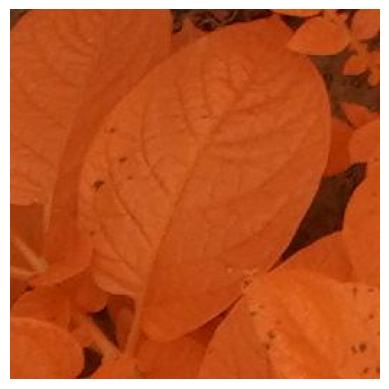

Actual Label: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted Label: 1


W0000 00:00:1723809131.196309     116 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [95]:
import numpy as np
import matplotlib.pyplot as plt

for images_batch, labels_batch in val_ds.take(1):
    first_image = images_batch[0].numpy().astype("uint8")
    print("First image to predict")
    plt.imshow(first_image)
    plt.axis('off')  # Hide axes
    plt.show()

    print("Actual Label:", class_names[int(labels_batch[0].numpy())])

    batch_prediction = model3.predict(images_batch)
    predicted_label = (batch_prediction[0] > 0.5).astype("int32")

    print("Predicted Label:", class_names[predicted_label[0]])

In [97]:
def predict(model3, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model3.predict(img_array)

  #predicted_class=class_names[np.argmax(predictions[0])]
  predicted_class = (batch_prediction[0] > 0.5).astype("int32")
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


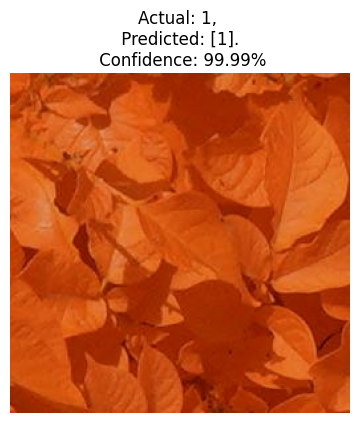

In [100]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model3, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


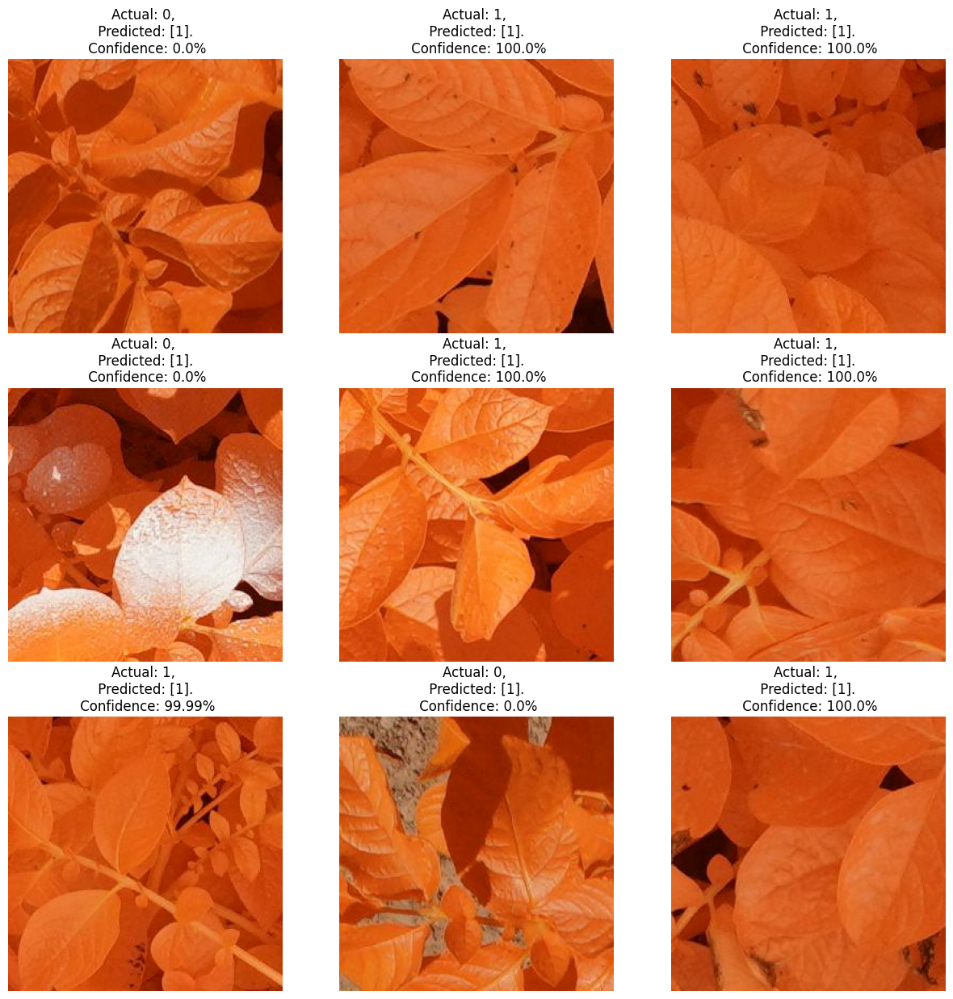

In [101]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model3, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

In [102]:
y_true2 = []
y_pred2 = []

for images, labels in val_ds:

    predictions = model3.predict(images)
    pred_labels = (predictions > 0.5).astype("int32")
    
    y_true2.extend(labels.numpy())
    y_pred2.extend(pred_labels)


y_true2 = np.array(y_true2)
y_pred2 = np.array(y_pred2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━

# Evaluation Metrics Resnet50

In [103]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


accuracy = accuracy_score(y_true2, y_pred2)
precision = precision_score(y_true2, y_pred2, average='weighted')
recall = recall_score(y_true2, y_pred2, average='weighted')
f1 = f1_score(y_true2, y_pred2, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9651988636363636
Precision: 0.9653088159333982
Recall: 0.9651988636363636
F1 Score: 0.9652142617839293


# Confusion Matrix resnet50

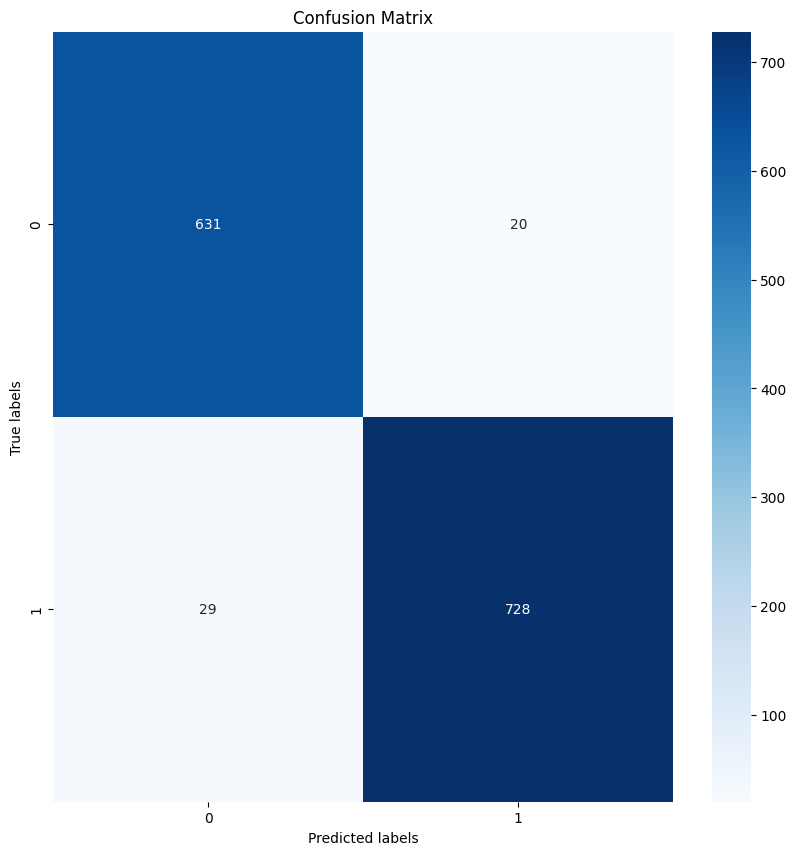

In [104]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt


cm = confusion_matrix(y_true2, y_pred2)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# ROC curve Resnet50

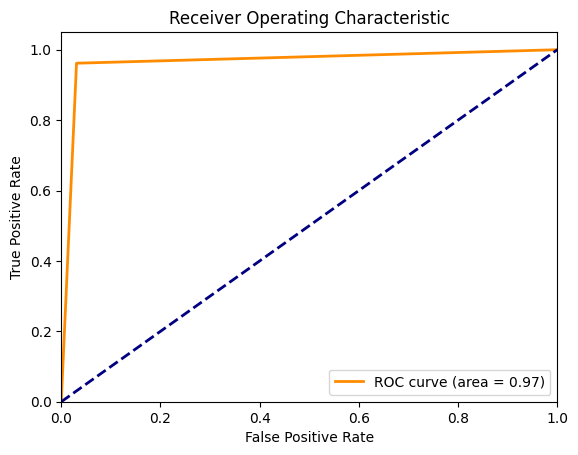

In [105]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(y_true2, y_pred2)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


# AUC Score Resnet50

In [106]:
from sklearn.metrics import roc_auc_score

auc = roc_auc_score(y_true2, y_pred2)

print(f'AUC Score: {auc}')


AUC Score: 0.9654844594334089


# COMPARING ACCURACIES OF PRE-TRAINED MODEL

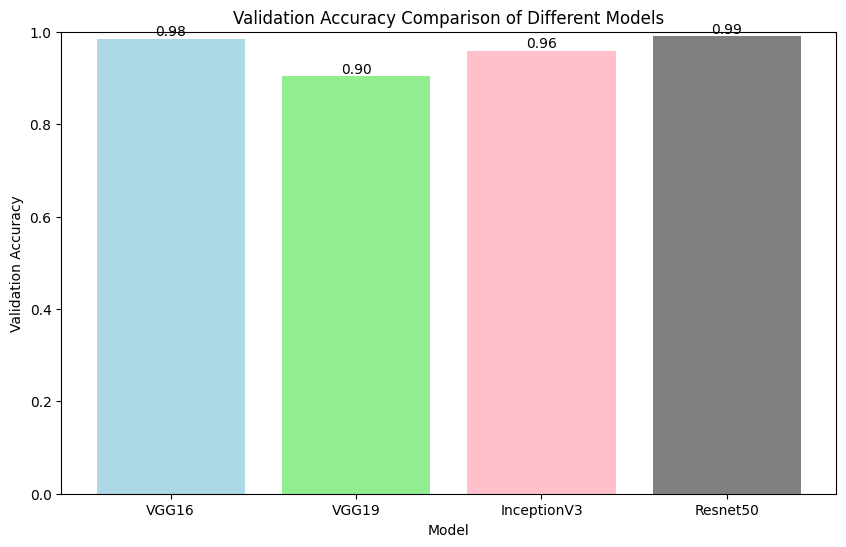

In [2]:
import matplotlib.pyplot as plt

models = ['VGG16','VGG19','InceptionV3','Resnet50']
val_accuracies = [0.9846,0.9040,0.9588,0.9901]


plt.figure(figsize=(10, 6))
plt.bar(models, val_accuracies, color=['lightblue', 'lightgreen', 'pink', 'grey'])
plt.xlabel('Model')
plt.ylabel('Validation Accuracy')
plt.title('Validation Accuracy Comparison of Different Models')
plt.ylim([0, 1])  # Set the y-axis limit to [0, 1] for better comparison
for i in range(len(models)):
    plt.text(i, val_accuracies[i], f"{val_accuracies[i]:.2f}", ha='center', va='bottom')
plt.show()


# XAI

In [ ]:
!pip install lime

In [118]:
%load_ext autoreload
%autoreload 2
import os,sys
try:
    import lime
except:
    sys.path.append(os.path.join('..', '..')) # add the current directory
    import lime
from lime import lime_image

In [119]:
explainer = lime_image.LimeImageExplainer()

In [120]:
%%time
# Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
explanation = explainer.explain_instance(images_batch[0].numpy().astype('double'), model3.predict, top_labels=3, hide_color=0, num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━

In [121]:
explanation

In [122]:
from skimage.segmentation import mark_boundaries

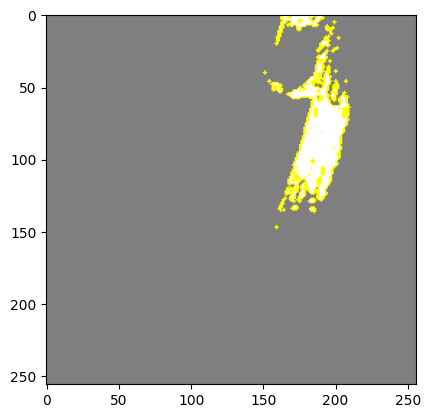

In [123]:
#here hide_rest is True
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=3, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

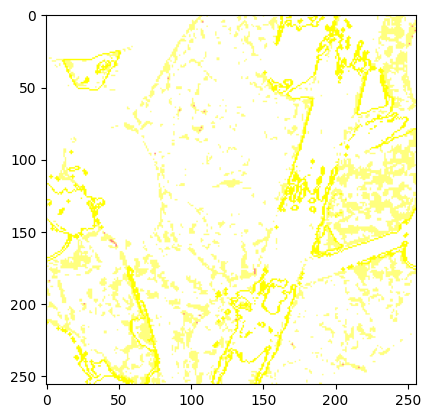

In [124]:
#here hide_rest is False
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

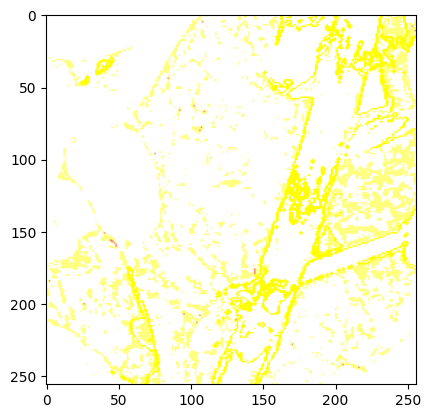

In [125]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

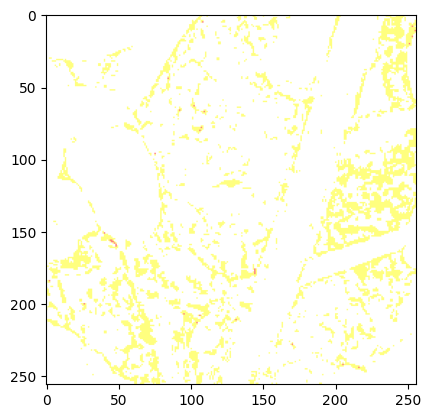

In [126]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

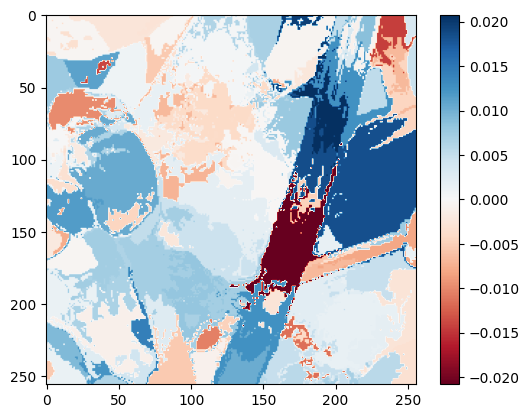

In [127]:
#Select the same class explained on the figures above.
ind =  explanation.top_labels[0]

#Map each explanation weight to the corresponding superpixel
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)

#Plot. The visualization makes more sense if a symmetrical colorbar is used.
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()

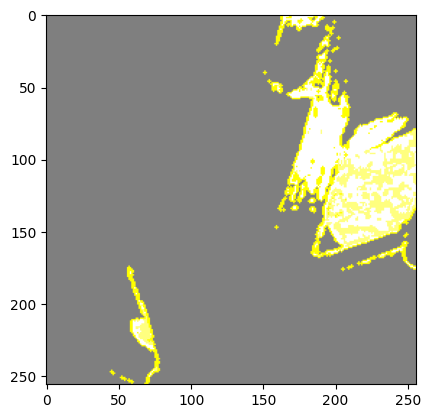

In [128]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

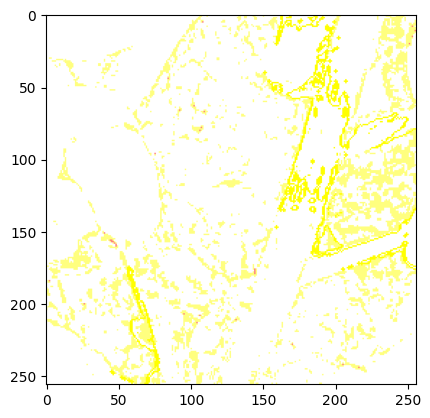

In [129]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

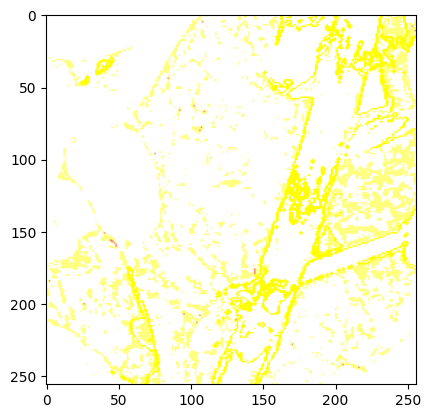

In [130]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

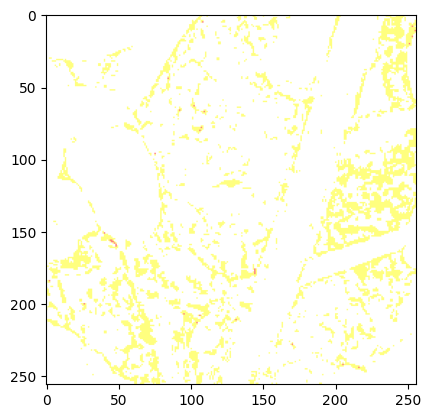

In [131]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

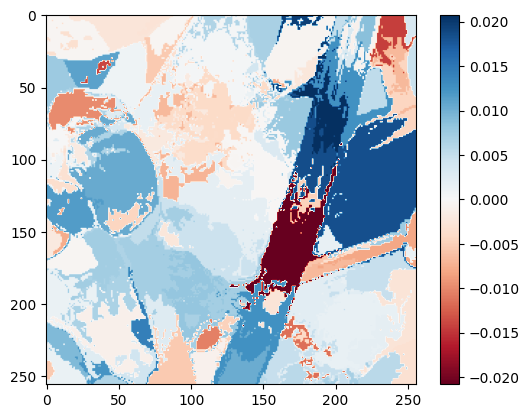

In [132]:
#Select the same class explained on the figures above.
ind =  explanation.top_labels[0]

#Map each explanation weight to the corresponding superpixel
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)

#Plot. The visualization makes more sense if a symmetrical colorbar is used.
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()

#  XAI for 1

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━

(-0.5, 255.5, 255.5, -0.5)

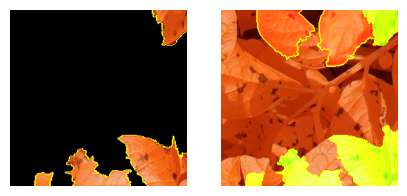

In [133]:
from skimage.io import imread
from skimage.transform import resize
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def read_and_transform_img(url):
    try:
        img = imread(url)
    except FileNotFoundError:
        print("File not found at the specified location.")
        return None
    
    img = resize(img, (256,256))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    return img

url = '/kaggle/input/sample-images/1.JPG'
images = read_and_transform_img(url)

if images is not None:
    preds = model3.predict(images)
    
from lime import lime_image

explainer = lime_image.LimeImageExplainer()

     

explanation = explainer.explain_instance(images[0].astype('double'), model.predict,  
                                         top_labels=3, hide_color=0, num_samples=1000)
from skimage.segmentation import mark_boundaries
temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(5,5))
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))
ax1.axis('off')

ax2.axis('off')